In [2]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , confusion_matrix , roc_auc_score , roc_curve
#from Pandas_Profilining import ProfileReport

In [2]:
from pandas_profiling import ProfileReport

In [3]:
df = pd.read_csv(r"C:\Users\lenovo\Downloads\dataset\winequality-red.csv")
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1591,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1592,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1593,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1594,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [6]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [7]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
x=df.iloc[:,:-1]
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1591,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1592,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1593,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1594,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [19]:
y=df.iloc[:,-1]
y

0       5
1       5
2       5
3       6
4       5
       ..
1591    5
1592    6
1593    6
1594    5
1595    6
Name: quality, Length: 1596, dtype: int64

In [20]:
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.20, random_state=111)

In [21]:
x_train, x_test, y_train, y_test

(      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
 328            10.2              0.36         0.64             2.9      0.122   
 1414            7.3              0.34         0.33             2.5      0.064   
 183             8.9              0.31         0.57             2.0      0.111   
 89              7.0              0.62         0.08             1.8      0.076   
 664            11.3              0.34         0.45             2.0      0.082   
 ...             ...               ...          ...             ...        ...   
 681             9.8              0.98         0.32             2.3      0.078   
 1299            9.1              0.37         0.32             2.1      0.064   
 86              8.6              0.49         0.28             1.9      0.110   
 724             6.4              0.57         0.02             1.8      0.067   
 876             7.2              0.60         0.04             2.5      0.076   
 
       free su

In [22]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
328,10.2,0.36,0.64,2.9,0.122,10.0,41.0,0.99800,3.23,0.66,12.5
1414,7.3,0.34,0.33,2.5,0.064,21.0,37.0,0.99520,3.35,0.77,12.1
183,8.9,0.31,0.57,2.0,0.111,26.0,85.0,0.99710,3.26,0.53,9.7
89,7.0,0.62,0.08,1.8,0.076,8.0,24.0,0.99780,3.48,0.53,9.0
664,11.3,0.34,0.45,2.0,0.082,6.0,15.0,0.99880,2.94,0.66,9.2
...,...,...,...,...,...,...,...,...,...,...,...
681,9.8,0.98,0.32,2.3,0.078,35.0,152.0,0.99800,3.25,0.48,9.4
1299,9.1,0.37,0.32,2.1,0.064,4.0,15.0,0.99576,3.30,0.80,11.2
86,8.6,0.49,0.28,1.9,0.110,20.0,136.0,0.99720,2.93,1.95,9.9
724,6.4,0.57,0.02,1.8,0.067,4.0,11.0,0.99700,3.46,0.68,9.5


In [23]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1017,11.3,0.36,0.66,2.4,0.123,3.0,8.0,0.99642,3.20,0.53,11.9
599,13.2,0.46,0.52,2.2,0.071,12.0,35.0,1.00060,3.10,0.56,9.0
1466,7.3,0.98,0.05,2.1,0.061,20.0,49.0,0.99705,3.31,0.55,9.7
1000,6.8,0.36,0.32,1.8,0.067,4.0,8.0,0.99280,3.36,0.55,12.8
435,11.1,0.45,0.73,3.2,0.066,6.0,22.0,0.99860,3.17,0.66,11.2
...,...,...,...,...,...,...,...,...,...,...,...
1420,6.4,0.53,0.09,3.9,0.123,14.0,31.0,0.99680,3.50,0.67,11.0
1491,6.4,0.31,0.09,1.4,0.066,15.0,28.0,0.99459,3.42,0.70,10.0
633,8.7,0.84,0.00,1.4,0.065,24.0,33.0,0.99540,3.27,0.55,9.7
1210,9.6,0.38,0.42,1.9,0.071,5.0,13.0,0.99659,3.15,0.75,10.5


In [24]:
df_model=DecisionTreeClassifier()

In [25]:
df_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [26]:
import sklearn
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

In [27]:
sklearn.__version__

'1.1.3'

[Text(0.6074716143808321, 0.975, 'X[10] <= 10.525\ngini = 0.64\nsamples = 1276\nvalue = [8, 43, 560, 496, 155, 14]'),
 Text(0.40402273887052875, 0.925, 'X[6] <= 95.5\ngini = 0.536\nsamples = 791\nvalue = [6, 28, 475, 251, 29, 2]'),
 Text(0.23495060993390357, 0.875, 'X[9] <= 0.585\ngini = 0.567\nsamples = 684\nvalue = [6, 28, 377, 243, 28, 2]'),
 Text(0.09031760303265941, 0.825, 'X[10] <= 9.75\ngini = 0.485\nsamples = 294\nvalue = [3, 20, 198, 70, 3, 0]'),
 Text(0.04105511275272162, 0.775, 'X[10] <= 9.075\ngini = 0.393\nsamples = 182\nvalue = [1, 12, 138, 30, 1, 0]'),
 Text(0.012441679626749611, 0.725, 'X[7] <= 0.996\ngini = 0.68\nsamples = 16\nvalue = [1, 3, 6, 6, 0, 0]'),
 Text(0.00933125972006221, 0.675, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]'),
 Text(0.015552099533437015, 0.675, 'X[6] <= 39.0\ngini = 0.622\nsamples = 14\nvalue = [1, 1, 6, 6, 0, 0]'),
 Text(0.00933125972006221, 0.625, 'X[9] <= 0.54\ngini = 0.449\nsamples = 7\nvalue = [0, 1, 1, 5, 0, 0]'),
 Text(0.006220

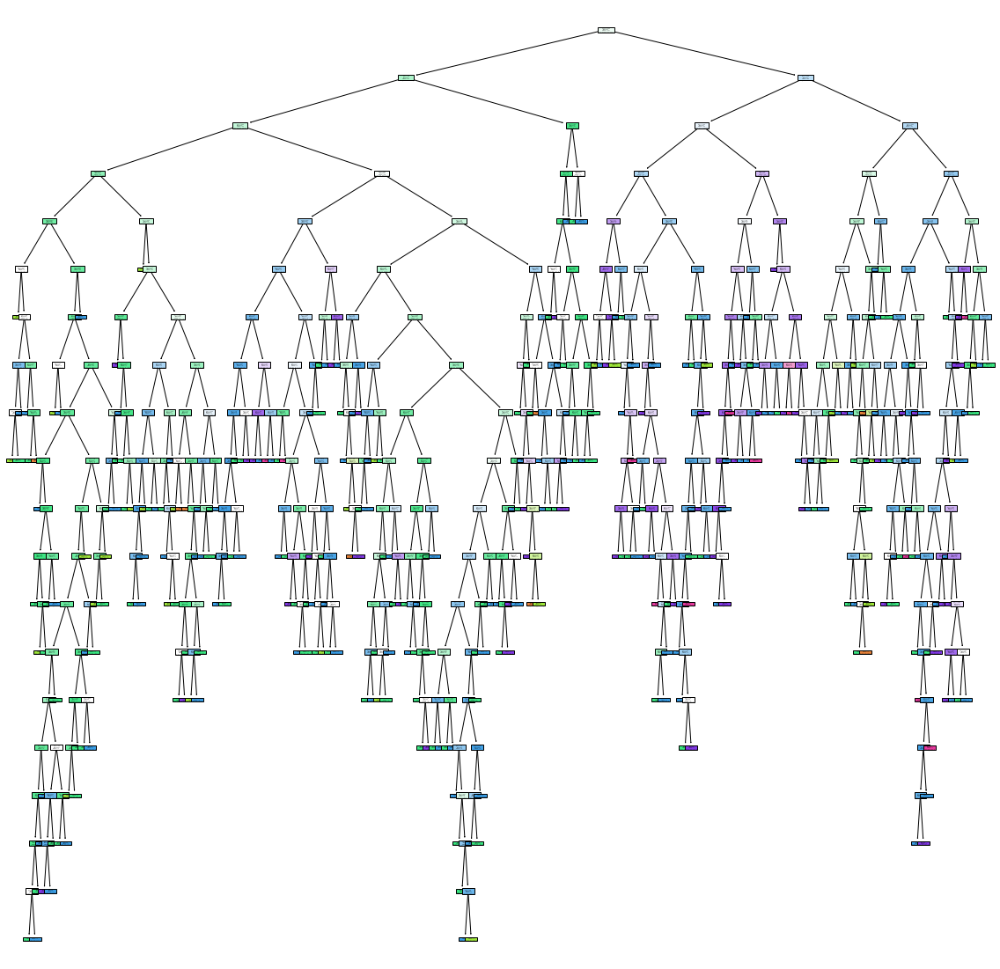

In [28]:
plt.figure(figsize=(20,20))
tree.plot_tree(df_model,filled=True)

In [29]:
df


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1591,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1592,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1593,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1594,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [30]:
df1=df.head(500)
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.90,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.60,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.30,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.90,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.90,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
495,7.2,0.34,0.32,2.50,0.090,43.0,113.0,0.9966,3.32,0.79,11.1,5
496,10.7,0.35,0.53,2.60,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8
497,8.7,0.69,0.31,3.00,0.086,23.0,81.0,1.0002,3.48,0.74,11.6,6
498,7.8,0.52,0.25,1.90,0.081,14.0,38.0,0.9984,3.43,0.65,9.0,6


In [31]:
x1=df1.iloc[:,:-1]
x1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.90,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.60,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.30,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.90,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.90,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
495,7.2,0.34,0.32,2.50,0.090,43.0,113.0,0.9966,3.32,0.79,11.1
496,10.7,0.35,0.53,2.60,0.070,5.0,16.0,0.9972,3.15,0.65,11.0
497,8.7,0.69,0.31,3.00,0.086,23.0,81.0,1.0002,3.48,0.74,11.6
498,7.8,0.52,0.25,1.90,0.081,14.0,38.0,0.9984,3.43,0.65,9.0


In [32]:
y1=df1.iloc[:,-1]

In [33]:
df1_model=DecisionTreeClassifier()

In [34]:
df1_model.fit(x1,y1)

DecisionTreeClassifier()

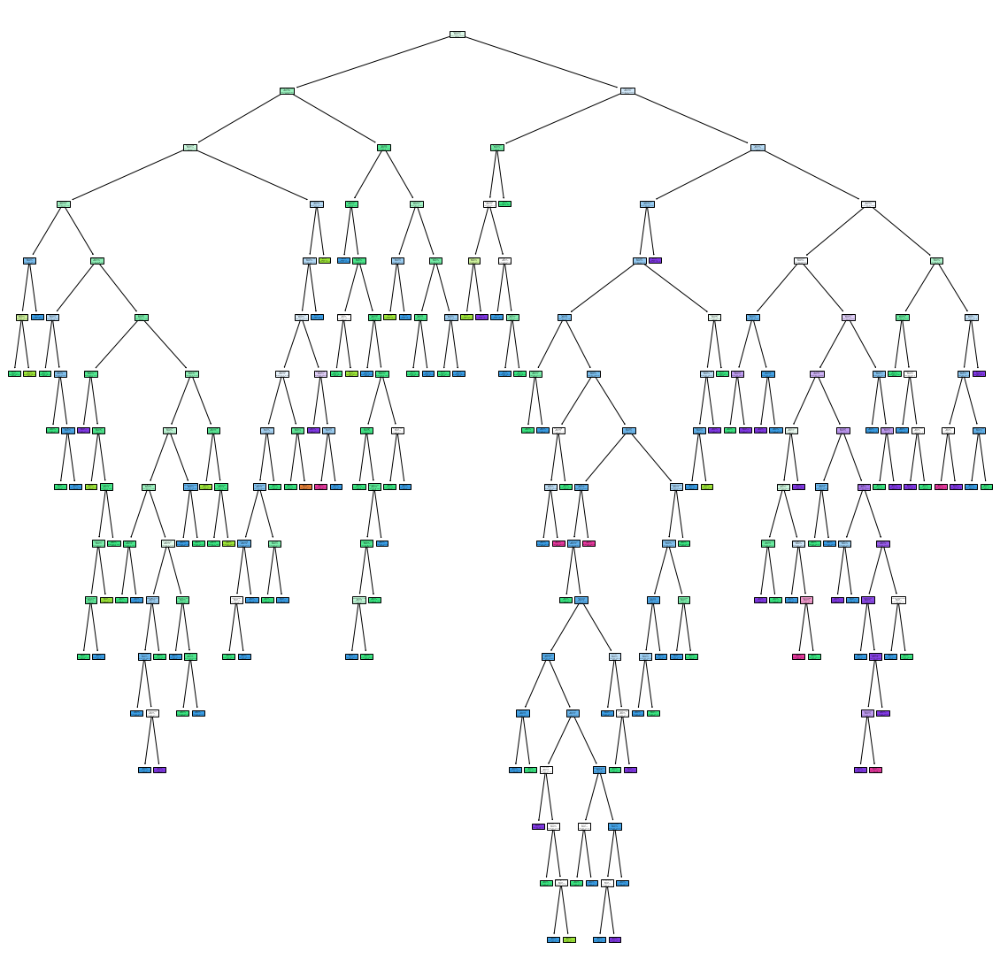

In [35]:
plt.figure(figsize=(20,20))
tree.plot_tree(df1_model,filled=True, class_names=[str(i) for i in set(y1)] , feature_names=x.columns)
plt.savefig('df1_model')

In [36]:
a=set(y1)
for i in a:
    print(str(i))

3
4
5
6
7
8


In [39]:
df1_model.predict(x)

array([5, 5, 5, ..., 6, 6, 6], dtype=int64)

In [40]:
df1_model.score(x_test,y_test)

0.578125

In [27]:
path= df1_model.cost_complexity_pruning_path(x1,y1)

In [28]:
path


{'ccp_alphas': array([0.        , 0.00166667, 0.00178571, 0.00181818, 0.00191304,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.00203333, 0.00252874, 0.00261111,
        0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00285714,
        0.003     , 0.003     , 0.003     , 0.00308418, 0.0032    ,
        0.0032    , 0.00328205, 0.00333333, 0.00333333, 0.00333333,
        0.00333333, 0.00334032, 0.00336606, 0.00348046, 0.00351398,
        0.0036    , 0.00366667, 0.00366667, 0.00366667, 0.00367391,
        0.00375   , 0.00377778, 0.0038    , 0.0038237 , 0.00392599,
        0.004     , 0.00428571, 0.00452121, 0.00465709, 0.00466667,
        0.00480769, 0.00481818, 0.00487179, 0.00492465, 0.00533333,
        0.00537662, 0.00539577, 0.00547368, 0.00554472, 0.00558545,
        0.00563716, 0.00598397, 0.00630156, 0.00672222, 0.00678788,
        0.00684649, 0.00688889, 0.

In [29]:
ccp_alpha = path.ccp_alphas

In [30]:
ccp_alpha

array([0.        , 0.00166667, 0.00178571, 0.00181818, 0.00191304,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.00203333, 0.00252874, 0.00261111,
       0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00285714,
       0.003     , 0.003     , 0.003     , 0.00308418, 0.0032    ,
       0.0032    , 0.00328205, 0.00333333, 0.00333333, 0.00333333,
       0.00333333, 0.00334032, 0.00336606, 0.00348046, 0.00351398,
       0.0036    , 0.00366667, 0.00366667, 0.00366667, 0.00367391,
       0.00375   , 0.00377778, 0.0038    , 0.0038237 , 0.00392599,
       0.004     , 0.00428571, 0.00452121, 0.00465709, 0.00466667,
       0.00480769, 0.00481818, 0.00487179, 0.00492465, 0.00533333,
       0.00537662, 0.00539577, 0.00547368, 0.00554472, 0.00558545,
       0.00563716, 0.00598397, 0.00630156, 0.00672222, 0.00678788,
       0.00684649, 0.00688889, 0.00701299, 0.00858654, 0.00889

In [31]:
df_model2=[]
for ccp in ccp_alpha:
    df_m = DecisionTreeClassifier(ccp_alpha=ccp)
    df_m.fit(x1,y1)
    df_model2.append(df_m)

In [32]:
df_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.0017857142857142854),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.00191304347826087),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002033333333333334),
 DecisionTreeClassifier(ccp_alpha=0.002528735632183909),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 DecisionTreeClassifier(ccp_alpha=0.0026666666666666666),
 DecisionTreeClassifier(ccp_alpha=0.0026666666666666666),
 DecisionTreeClassifier(ccp_alpha=0.0026666666666666666),
 DecisionTreeClassifier(ccp_alpha=0.002666666

Text(0, 0.5, 'score')

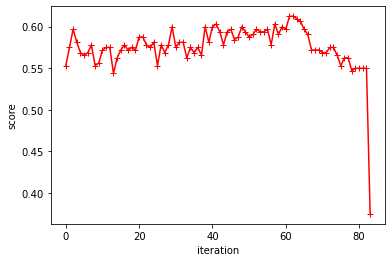

In [33]:
df_model2=[]
score = []
for ccp in ccp_alpha:
    df_m = DecisionTreeClassifier(ccp_alpha=ccp)
    df_m.fit(x1,y1)
    df_model2.append(df_m)
    score.append(df_m.score(x_test,y_test))
    
    
plt.plot(score,  'r-+')
plt.xlabel('iteration')
plt.ylabel('score')

In [36]:
train_score = [i.score(x1,y1) for i in df_model2]
train_score

[1.0,
 0.998,
 1.0,
 0.996,
 0.99,
 0.978,
 0.972,
 0.978,
 0.972,
 0.97,
 0.97,
 0.97,
 0.97,
 0.966,
 0.958,
 0.96,
 0.938,
 0.938,
 0.938,
 0.938,
 0.938,
 0.944,
 0.944,
 0.938,
 0.942,
 0.932,
 0.932,
 0.938,
 0.932,
 0.924,
 0.924,
 0.918,
 0.912,
 0.91,
 0.91,
 0.914,
 0.906,
 0.906,
 0.902,
 0.902,
 0.9,
 0.898,
 0.894,
 0.898,
 0.898,
 0.894,
 0.892,
 0.888,
 0.88,
 0.876,
 0.864,
 0.868,
 0.85,
 0.846,
 0.842,
 0.83,
 0.82,
 0.816,
 0.8,
 0.796,
 0.79,
 0.806,
 0.782,
 0.806,
 0.772,
 0.784,
 0.752,
 0.728,
 0.716,
 0.712,
 0.708,
 0.702,
 0.686,
 0.686,
 0.678,
 0.67,
 0.65,
 0.65,
 0.612,
 0.594,
 0.594,
 0.594,
 0.556,
 0.478]

In [37]:
test_score = [i.score(x_test,y_test) for i in df_model2]
test_score

[0.553125,
 0.575,
 0.596875,
 0.58125,
 0.56875,
 0.565625,
 0.56875,
 0.578125,
 0.553125,
 0.55625,
 0.571875,
 0.575,
 0.575,
 0.54375,
 0.5625,
 0.571875,
 0.578125,
 0.571875,
 0.575,
 0.571875,
 0.5875,
 0.5875,
 0.578125,
 0.575,
 0.58125,
 0.553125,
 0.578125,
 0.56875,
 0.578125,
 0.6,
 0.575,
 0.58125,
 0.58125,
 0.5625,
 0.575,
 0.56875,
 0.575,
 0.565625,
 0.6,
 0.58125,
 0.6,
 0.603125,
 0.59375,
 0.578125,
 0.59375,
 0.596875,
 0.584375,
 0.5875,
 0.6,
 0.59375,
 0.5875,
 0.590625,
 0.596875,
 0.59375,
 0.59375,
 0.596875,
 0.578125,
 0.603125,
 0.590625,
 0.6,
 0.596875,
 0.6125,
 0.6125,
 0.609375,
 0.60625,
 0.596875,
 0.590625,
 0.571875,
 0.571875,
 0.571875,
 0.56875,
 0.56875,
 0.575,
 0.575,
 0.565625,
 0.553125,
 0.5625,
 0.5625,
 0.546875,
 0.55,
 0.55,
 0.55,
 0.55,
 0.375]

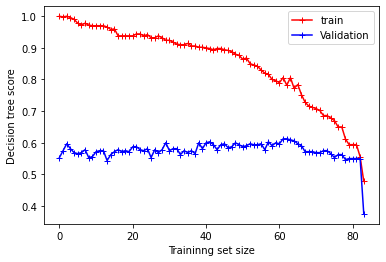

In [38]:
plt.plot(train_score,  'r-+', label = 'train')
plt.plot(test_score,  'b-+', label = 'Validation')
plt.xlabel('Traininng set size')
plt.ylabel('Decision tree score')
plt.legend()

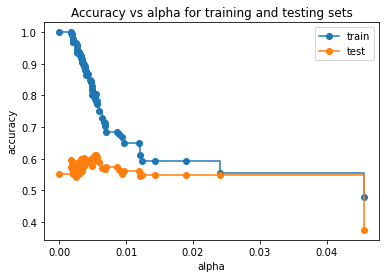

In [39]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train",drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test",drawstyle="steps-post")
ax.legend()
plt.show()

In [40]:
dt_model_ccp = DecisionTreeClassifier(random_state=0, ccp_alpha=0.014)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(0.4444444444444444, 0.875, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 15, 239, 184, 53, 8]'),
 Text(0.2222222222222222, 0.625, 'X[6] <= 62.5\ngini = 0.502\nsamples = 259\nvalue = [1, 11, 167, 73, 6, 1]'),
 Text(0.1111111111111111, 0.375, 'gini = 0.576\nsamples = 170\nvalue = [1, 9, 91, 62, 6, 1]'),
 Text(0.3333333333333333, 0.375, 'gini = 0.255\nsamples = 89\nvalue = [0, 2, 76, 11, 0, 0]'),
 Text(0.6666666666666666, 0.625, 'X[9] <= 0.545\ngini = 0.659\nsamples = 241\nvalue = [0, 4, 72, 111, 47, 7]'),
 Text(0.5555555555555556, 0.375, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(0.7777777777777778, 0.375, 'X[9] <= 0.705\ngini = 0.64\nsamples = 209\nvalue = [0, 2, 48, 106, 46, 7]'),
 Text(0.6666666666666666, 0.125, 'gini = 0.53\nsamples = 100\nvalue = [0, 2, 23, 64, 8, 3]'),
 Text(0.8888888888888888, 0.125, 'gini = 0.676\nsamples = 109\nvalue = [0, 0, 25, 42, 38, 4]')]

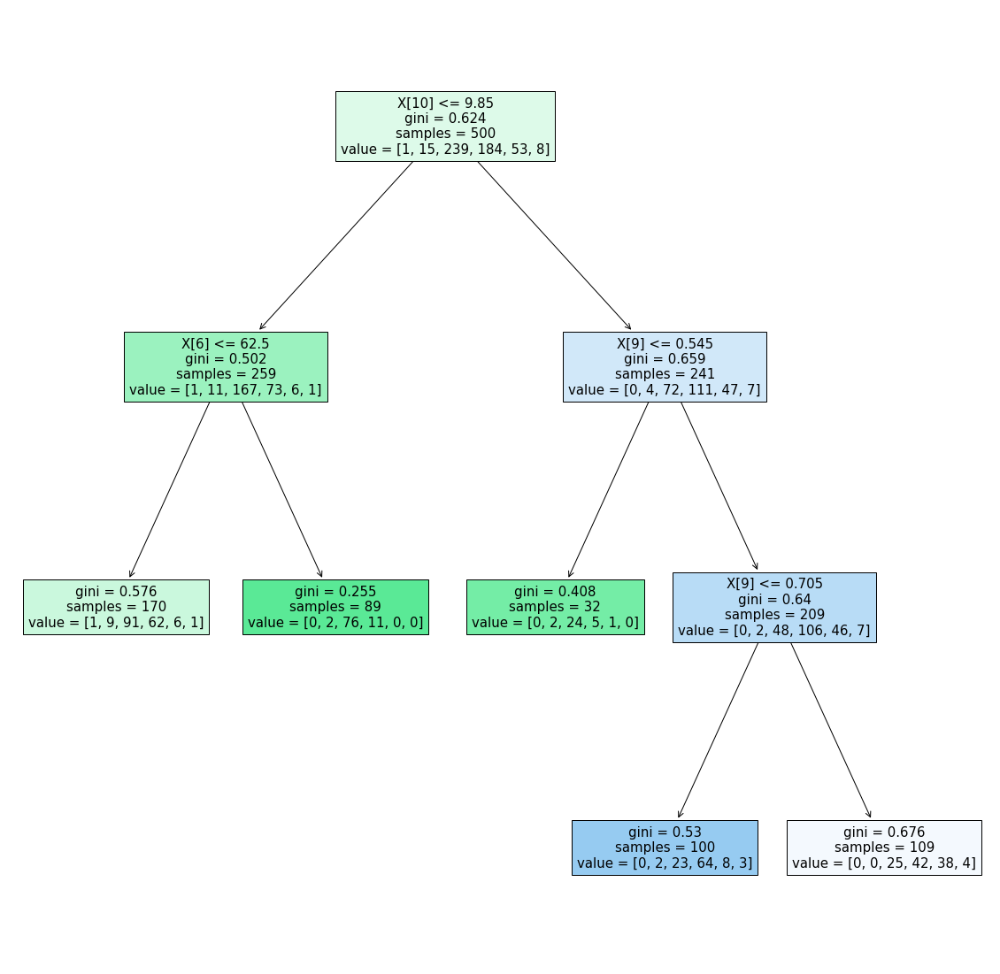

In [41]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [42]:
dt_model_ccp.score(x1,y1)

0.594

In [43]:
dt_model_ccp.score(x_test,y_test)

0.55

In [44]:
 DecisionTreeClassifier()

DecisionTreeClassifier()

In [54]:
grid_pram = {  "criterion":['gini','entropy'],
    "splitter":['best','random'],
    "max_depth": range(2,40,1),
    "min_samples_split": range(2,10,1),
    "min_samples_leaf": range(1,10,1),
    "ccp_alpha":np.random.rand(20)
    
}

In [55]:
grid_ccp=GridSearchCV(estimator=dt_model_ccp,param_grid=grid_pram, cv = 5 , n_jobs= -1)   # -1 MINES ENGEAGE ALL


In [56]:
grid_ccp.fit(x1,y1)

C:\Users\lenovo\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:684: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'ccp_alpha': array([0.31257341, 0.89402952, 0.13804378, 0.78712431, 0.33193374,
       0.3510832 , 0.31149281, 0.16668383, 0.35169954, 0.26034756,
       0.89914537, 0.82367772, 0.79656762, 0.53296569, 0.95538727,
       0.17509889, 0.84871507, 0.97516131, 0.54842711, 0.79652705]),
                         'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [48]:
grid_ccp.best_params_

{'criterion': 'entropy',
 'max_depth': 7,
 'min_samples_leaf': 6,
 'min_samples_split': 2,
 'splitter': 'random'}

In [49]:
dt_ccp_new=DecisionTreeClassifier(criterion='entropy', max_depth=7, min_samples_leaf=6, min_samples_split=2, splitter='random')

In [57]:
dt_ccp_new.fit(x1,y1)

DecisionTreeClassifier(criterion='entropy', max_depth=7, min_samples_leaf=6,
                       splitter='random')

In [58]:
dt_ccp_new.score(x1,y1)

0.648

In [59]:
dt_ccp_new.score(x_test, y_test).round(2)

0.55

In [60]:
pred = dt_ccp_new.predict(x_train)

In [61]:
confusion_matrix(y_train,pred)

array([[  0,   0,   5,   3,   0,   0],
       [  0,   4,  21,  18,   0,   0],
       [  0,   2, 367, 190,   1,   0],
       [  0,   2, 145, 341,   8,   0],
       [  0,   0,  19, 117,  19,   0],
       [  0,   0,   2,  10,   2,   0]], dtype=int64)